In [1]:
import tensorflow as tf
import tqdm
import h5py
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import cv2

import util
mobilenet = tf.keras.applications.mobilenet

In [2]:
mob_net_feat = mobilenet.MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [3]:
test_path = './images/penny_pics/IMG_0645.jpg'

In [4]:
img = util.read_image_as_nparr_RGB(test_path, shape = (224, 224))

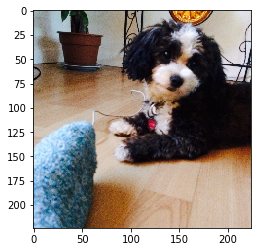

In [5]:
plt.imshow(img)
plt.show()

In [6]:
import os

In [7]:
files = [file for file in os.listdir('./images/penny_pics/') if file.endswith('jpg')]

In [8]:
len(files), files[:5]

(39,
 ['IMG_0645.jpg',
  'IMG_0700.jpg',
  'IMG_0841.jpg',
  'IMG_1564.jpg',
  'IMG_1711.jpg'])

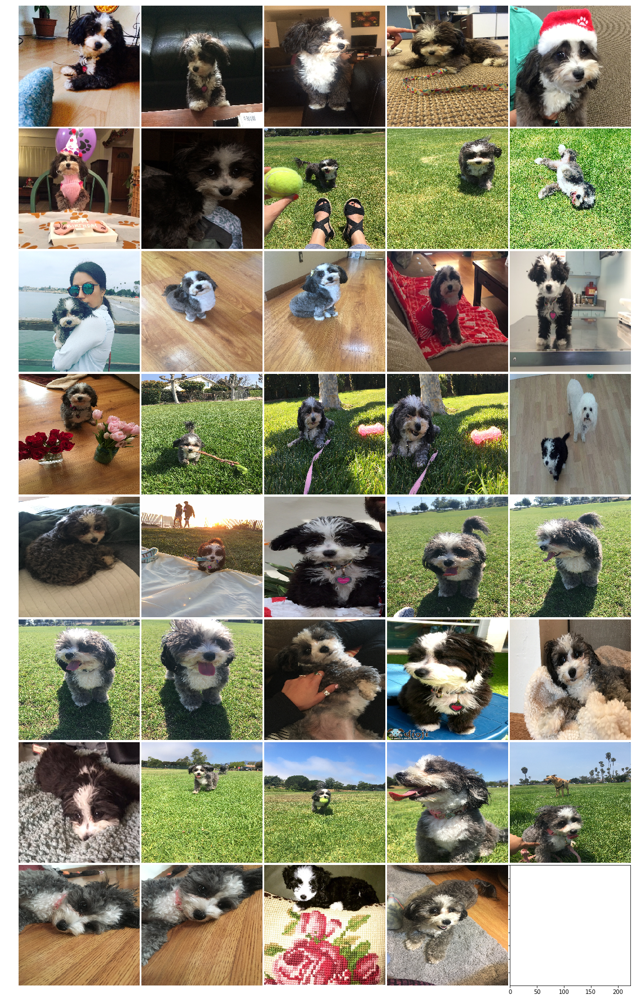

In [9]:
fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(8, 5), axes_pad=0.05)

idx = 0
for file in files[:]:
    ax = grid[idx]
    img = util.read_image_as_nparr_RGB(path='./images/penny_pics/{file}'.format(file=file), shape=(224, 224))
    ax.imshow(img)
    ax.axis('off')
    idx += 1
plt.show()

In [10]:
ImageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator

In [11]:
#from keras docs
datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

In [12]:
img.shape

(224, 224, 3)

In [13]:
img = util.read_image_as_nparr_RGB(test_path, shape = (224, 224))
images = []

for i, img_aug in enumerate(datagen.flow(np.expand_dims(img, axis = 0), batch_size=4)):
    
    if i < 50:
        images.append(img_aug)
    else:
        break

        
len(images)

50

In [14]:
images[0][0].shape

(224, 224, 3)

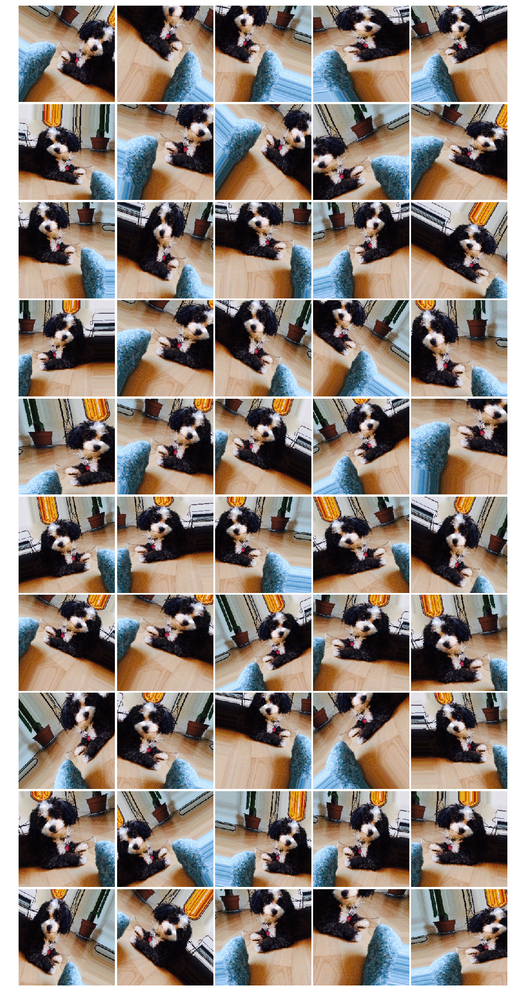

In [15]:
fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(10, 5), axes_pad=0.05)

idx = 0
for img_tmp in images:
    ax = grid[idx]
    
    ax.imshow(img_tmp[0].astype('uint8'))
    ax.axis('off')
    idx += 1
plt.show()

In [19]:
images = []
for file in files[:]:
    img = util.read_image_as_nparr_RGB(path='./images/penny_pics/{file}'.format(file=file), shape=(224, 224))
    images.append(img)
images = np.array(images)
images.shape

(39, 224, 224, 3)

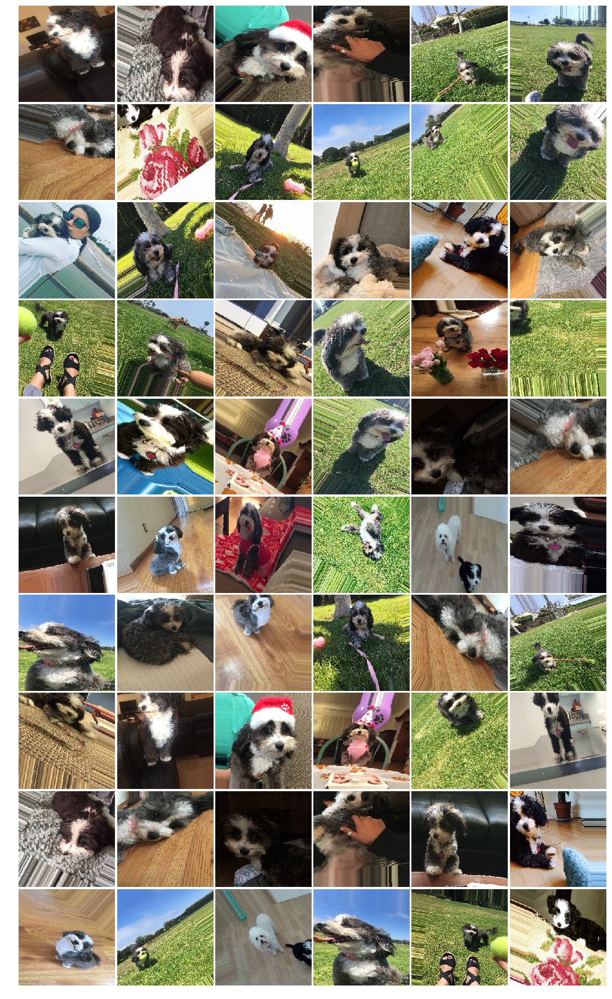

In [17]:
fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(10, 6), axes_pad=0.05)

for idx, img_aug in enumerate(datagen.flow(images, batch_size=1)):
    
    if idx < 60:
        ax = grid[idx]
        ax.imshow(img_aug[0].astype('uint8'))
        ax.axis('off')
    else:
        break
plt.show()

In [37]:
images_arr = None
for idx, img_aug in enumerate(datagen.flow(images, batch_size=10)):
    print(idx,img_aug.shape)
    if images_arr is None:
        images_arr = img_aug
    else:
        images_arr = np.vstack((images_arr, img_aug))
    print(images_arr.shape)
    if idx > 10:
        break

0 (10, 224, 224, 3)
(10, 224, 224, 3)
1 (10, 224, 224, 3)
(20, 224, 224, 3)
2 (10, 224, 224, 3)
(30, 224, 224, 3)
3 (9, 224, 224, 3)
(39, 224, 224, 3)
4 (10, 224, 224, 3)
(49, 224, 224, 3)
5 (10, 224, 224, 3)
(59, 224, 224, 3)
6 (10, 224, 224, 3)
(69, 224, 224, 3)
7 (9, 224, 224, 3)
(78, 224, 224, 3)
8 (10, 224, 224, 3)
(88, 224, 224, 3)
9 (10, 224, 224, 3)
(98, 224, 224, 3)
10 (10, 224, 224, 3)
(108, 224, 224, 3)
11 (9, 224, 224, 3)
(117, 224, 224, 3)


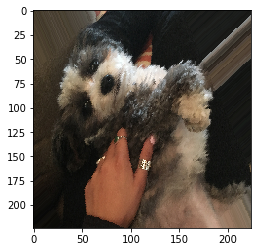

In [40]:
plt.imshow(images_arr[0].astype('uint8'))
plt.show()

In [35]:
np.vstack((np.expand_dims(images_arr[0], axis = 0), np.expand_dims(images_arr[1], axis = 0))).shape

(2, 224, 224, 3)

In [42]:
ilsrvc_gen = ImageDataGenerator()

In [44]:
g = ilsrvc_gen.flow_from_directory('./images/ILSVRC/Data/DET', target_size=(224, 224), batch_size = 32)

Found 5500 images belonging to 1 classes.


In [45]:
data = g.next()

ImportError: Could not import PIL.Image. The use of `array_to_img` requires PIL.